# Practical Application III: Comparing Classifiers

**Overview**: In this practical application, your goal is to compare the performance of the classifiers we encountered in this section, namely K Nearest Neighbor, Logistic Regression, Decision Trees, and Support Vector Machines.  We will utilize a dataset related to marketing bank products over the telephone.  



### Getting Started

Our dataset comes from the UCI Machine Learning repository [link](https://archive.ics.uci.edu/ml/datasets/bank+marketing).  The data is from a Portugese banking institution and is a collection of the results of multiple marketing campaigns.  We will make use of the article accompanying the dataset [here](CRISP-DM-BANK.pdf) for more information on the data and features.



### Problem 1: Understanding the Data

To gain a better understanding of the data, please read the information provided in the UCI link above, and examine the **Materials and Methods** section of the paper.  How many marketing campaigns does this data represent?

In [4]:
print(''' # Direct Marketing Dataset Preliminary findings 
 - The dataset is of Portuguese bank marketing campaigns between May 2008 - November 2010
 - The dataset contains 21 features column of which 10 are numerical and 11 categorical
 - The categorical column y is the target column with values yes/no 
 - There are approx 41k rows of dataset 
 - The objective is to predict if the customer will subscribe to term deposit or not.
 ''')

 # Direct Marketing Dataset Preliminary findings 
 - The dataset is of Portuguese bank marketing campaigns between May 2008 - November 2010
 - The dataset contains 21 features column of which 10 are numerical and 11 categorical
 - The categorical column y is the target column with values yes/no 
 - There are approx 41k rows of dataset 
 - The objective is to predict if the customer will subscribe to term deposit or not.
 


### Problem 2: Read in the Data

Use pandas to read in the dataset `bank-additional-full.csv` and assign to a meaningful variable name.

In [7]:
import pandas as pd
import numpy as np
import seaborn as sns
import math
import matplotlib.pyplot as plt
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.impute import SimpleImputer
from sklearn.model_selection import GridSearchCV, train_test_split, cross_val_score
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC, LinearSVC
from sklearn.tree import DecisionTreeClassifier, plot_tree
from sklearn.metrics import (make_scorer, accuracy_score, precision_score, f1_score, auc, 
                           roc_auc_score, recall_score, confusion_matrix,
                           classification_report, roc_curve, precision_recall_curve,
                           average_precision_score, ConfusionMatrixDisplay )
import time, tempfile
from sklearn.dummy import DummyClassifier
from sklearn import tree

In [8]:
df = pd.read_csv('data/bank-additional-full.csv', sep = ';')

In [9]:
df.head()

,age,job,marital,education,default,housing,loan,contact,month,day_of_week,...,campaign,pdays,previous,poutcome,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,y
0,56,housemaid,married,basic.4y,no,no,no,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
1,57,services,married,high.school,unknown,no,no,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
2,37,services,married,high.school,no,yes,no,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
3,40,admin.,married,basic.6y,no,no,no,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
4,56,services,married,high.school,no,no,yes,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no


In [10]:
df.sample(5)

,age,job,marital,education,default,housing,loan,contact,month,day_of_week,...,campaign,pdays,previous,poutcome,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,y
5597,43,admin.,divorced,high.school,no,no,no,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
22873,32,housemaid,married,basic.4y,no,yes,no,cellular,aug,mon,...,9,999,0,nonexistent,1.4,93.444,-36.1,4.965,5228.1,no
29171,37,technician,married,professional.course,no,no,no,cellular,apr,fri,...,2,999,0,nonexistent,-1.8,93.075,-47.1,1.405,5099.1,no
38215,35,technician,married,university.degree,no,yes,no,telephone,oct,wed,...,2,999,0,nonexistent,-3.4,92.431,-26.9,0.740,5017.5,no
17125,53,retired,married,high.school,no,no,no,cellular,jul,fri,...,2,999,0,nonexistent,1.4,93.918,-42.7,4.962,5228.1,no


In [11]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 41188 entries, 0 to 41187
Data columns (total 21 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   age             41188 non-null  int64  
 1   job             41188 non-null  object 
 2   marital         41188 non-null  object 
 3   education       41188 non-null  object 
 4   default         41188 non-null  object 
 5   housing         41188 non-null  object 
 6   loan            41188 non-null  object 
 7   contact         41188 non-null  object 
 8   month           41188 non-null  object 
 9   day_of_week     41188 non-null  object 
 10  duration        41188 non-null  int64  
 11  campaign        41188 non-null  int64  
 12  pdays           41188 non-null  int64  
 13  previous        41188 non-null  int64  
 14  poutcome        41188 non-null  object 
 15  emp.var.rate    41188 non-null  float64
 16  cons.price.idx  41188 non-null  float64
 17  cons.conf.idx   41188 non-null 

In [12]:
df.describe()

,age,duration,campaign,pdays,previous,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed
count,41188.00000,41188.000000,41188.000000,41188.000000,41188.000000,41188.000000,41188.000000,41188.000000,41188.000000,41188.000000
mean,40.02406,258.285010,2.567593,962.475454,0.172963,0.081886,93.575664,-40.502600,3.621291,5167.035911
std,10.42125,259.279249,2.770014,186.910907,0.494901,1.570960,0.578840,4.628198,1.734447,72.251528
min,17.00000,0.000000,1.000000,0.000000,0.000000,-3.400000,92.201000,-50.800000,0.634000,4963.600000
25%,32.00000,102.000000,1.000000,999.000000,0.000000,-1.800000,93.075000,-42.700000,1.344000,5099.100000
50%,38.00000,180.000000,2.000000,999.000000,0.000000,1.100000,93.749000,-41.800000,4.857000,5191.000000
75%,47.00000,319.000000,3.000000,999.000000,0.000000,1.400000,93.994000,-36.400000,4.961000,5228.100000
max,98.00000,4918.000000,56.000000,999.000000,7.000000,1.400000,94.767000,-26.900000,5.045000,5228.100000


In [13]:
df.isnull().sum()

age               0
job               0
marital           0
education         0
default           0
housing           0
loan              0
contact           0
month             0
day_of_week       0
duration          0
campaign          0
pdays             0
previous          0
poutcome          0
emp.var.rate      0
cons.price.idx    0
cons.conf.idx     0
euribor3m         0
nr.employed       0
y                 0
dtype: int64

In [14]:
df.drop_duplicates(inplace=True)
df.reset_index(drop=True, inplace=True)
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 41176 entries, 0 to 41175
Data columns (total 21 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   age             41176 non-null  int64  
 1   job             41176 non-null  object 
 2   marital         41176 non-null  object 
 3   education       41176 non-null  object 
 4   default         41176 non-null  object 
 5   housing         41176 non-null  object 
 6   loan            41176 non-null  object 
 7   contact         41176 non-null  object 
 8   month           41176 non-null  object 
 9   day_of_week     41176 non-null  object 
 10  duration        41176 non-null  int64  
 11  campaign        41176 non-null  int64  
 12  pdays           41176 non-null  int64  
 13  previous        41176 non-null  int64  
 14  poutcome        41176 non-null  object 
 15  emp.var.rate    41176 non-null  float64
 16  cons.price.idx  41176 non-null  float64
 17  cons.conf.idx   41176 non-null 

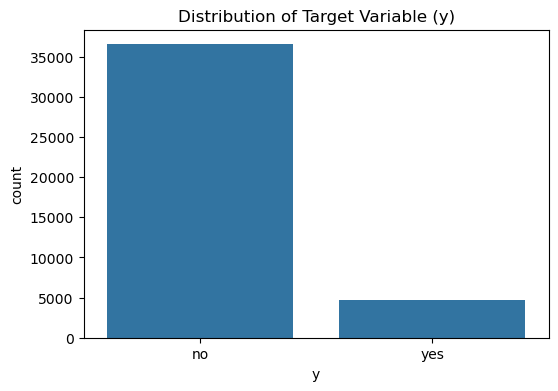

y
no     88.733728
yes    11.266272
Name: proportion, dtype: float64

From the graph, the data is imbalanced in which No is 88.73% and Yes is 11.27%


In [15]:
#Checking distribution of the target value
plt.figure(figsize=(6, 4))
sns.countplot(data=df, x='y')
plt.title("Distribution of Target Variable (y)")
plt.show()
display(df['y'].value_counts(normalize=True) * 100)
print('From the graph, the data is imbalanced in which No is 88.73% and Yes is 11.27%')

In [16]:
# Generating a Profile report
!pip install ydata-profiling

from ydata_profiling import ProfileReport

profile = ProfileReport(df)
profile.to_file(output_file='output.html')

#generate report
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]


100%|██████████| 21/21 [00:00<00:00, 477.71it/s]


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

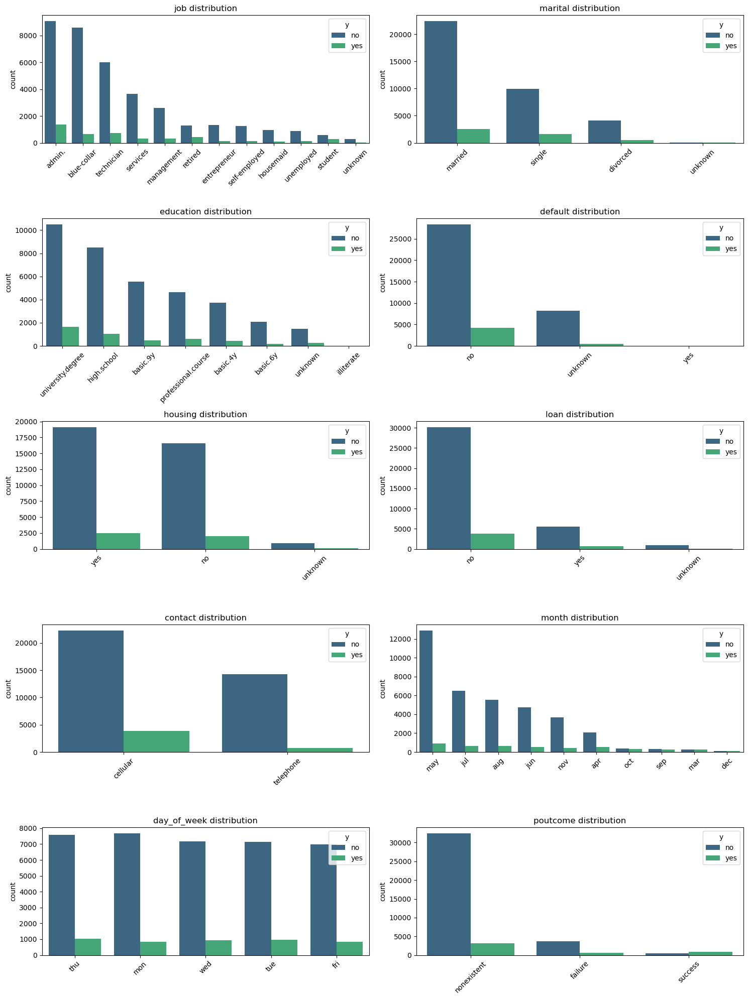

In [18]:
#Analyzing categorical columns wrt Yes and No

cat_cols = ['job', 'marital', 'education', 'default', 'housing', 'loan','contact', 'month', 'day_of_week', 'poutcome']

plt.figure(figsize=(15, 20))
for i, col in enumerate(cat_cols, 1):
    plt.subplot(5, 2, i)
    sns.countplot(data=df, x=col, order=df[col].value_counts().index, hue='y', palette='viridis')
    plt.xticks(rotation=45)
    plt.title(f'{col} distribution')
    plt.xlabel('')
plt.tight_layout()
plt.show()

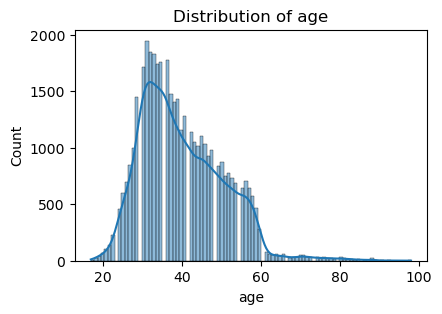

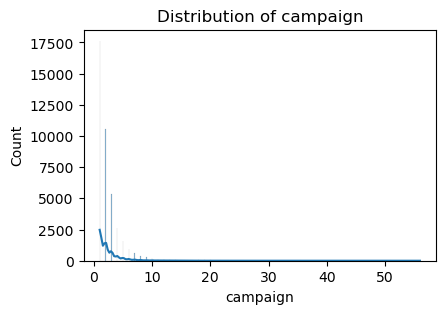

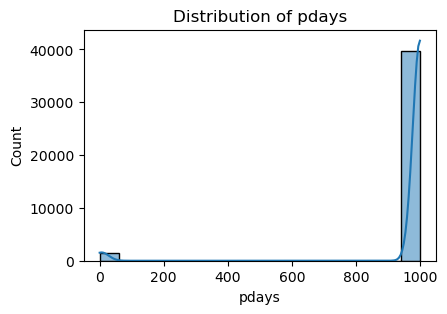

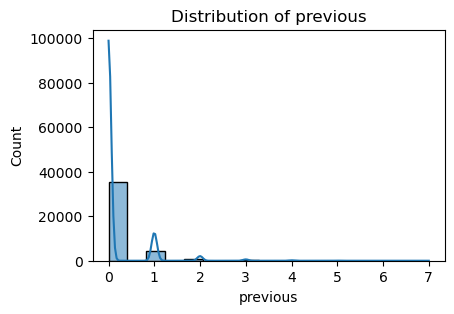

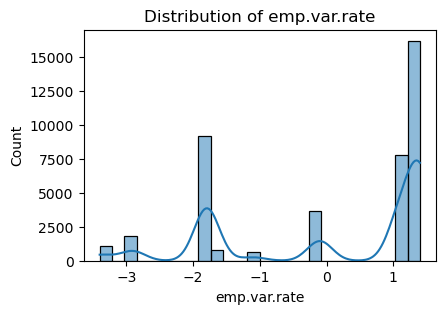

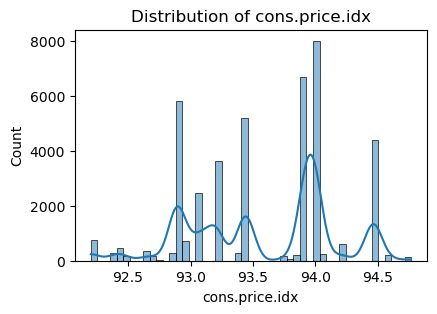

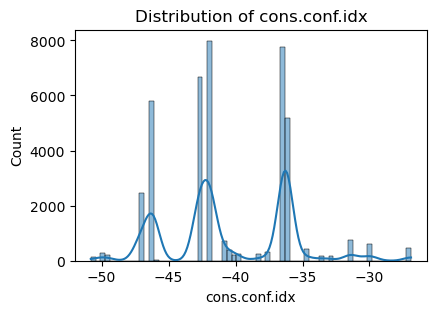

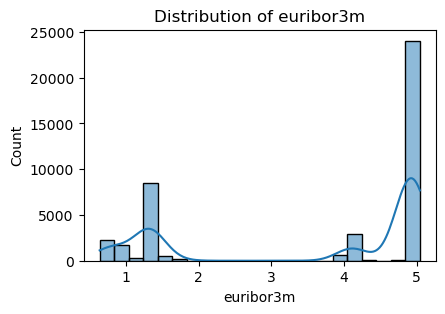

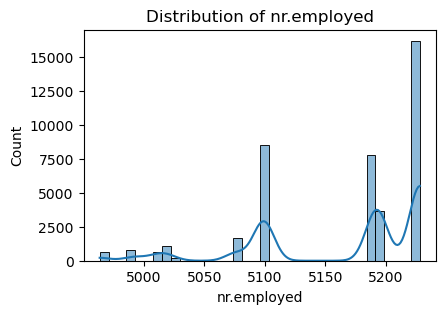

In [23]:
#Analyzing numerical columns wrt Yes or no
num_cols = ['age', 'campaign', 'pdays', 'previous', 'emp.var.rate', 'cons.price.idx', 'cons.conf.idx', 'euribor3m', 'nr.employed']
for col in num_cols:
    plt.figure(figsize=(10, 3))
    plt.subplot(1, 2, 1)
    sns.histplot(data=df, x=col, kde=True)
    plt.title(f"Distribution of {col}")
    plt.show()

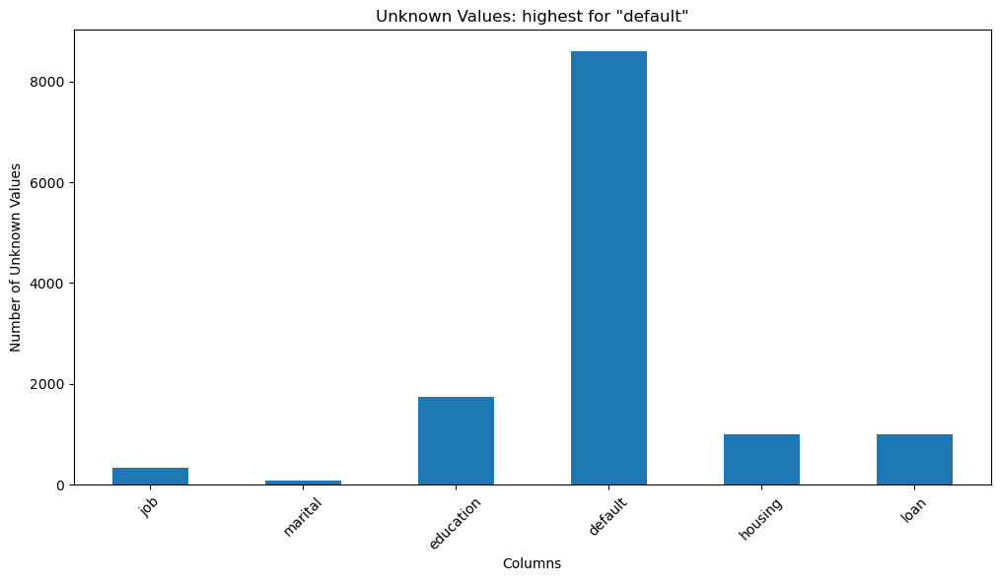

In [26]:
# Unknown values

unknown_counts = df.isin(['unknown']).sum()
unknown_counts = unknown_counts[unknown_counts > 0]

plt.figure(figsize=(12, 6))
unknown_counts.plot(kind='bar')
plt.title('Unknown Values: highest for "default"')
plt.xlabel('Columns')
plt.ylabel('Number of Unknown Values')
plt.xticks(rotation=45)
plt.show()


### Problem 3: Understanding the Features


Examine the data description below, and determine if any of the features are missing values or need to be coerced to a different data type.


```
Input variables:
# bank client data:
1 - age (numeric)
2 - job : type of job (categorical: 'admin.','blue-collar','entrepreneur','housemaid','management','retired','self-employed','services','student','technician','unemployed','unknown')
3 - marital : marital status (categorical: 'divorced','married','single','unknown'; note: 'divorced' means divorced or widowed)
4 - education (categorical: 'basic.4y','basic.6y','basic.9y','high.school','illiterate','professional.course','university.degree','unknown')
5 - default: has credit in default? (categorical: 'no','yes','unknown')
6 - housing: has housing loan? (categorical: 'no','yes','unknown')
7 - loan: has personal loan? (categorical: 'no','yes','unknown')
# related with the last contact of the current campaign:
8 - contact: contact communication type (categorical: 'cellular','telephone')
9 - month: last contact month of year (categorical: 'jan', 'feb', 'mar', ..., 'nov', 'dec')
10 - day_of_week: last contact day of the week (categorical: 'mon','tue','wed','thu','fri')
11 - duration: last contact duration, in seconds (numeric). Important note: this attribute highly affects the output target (e.g., if duration=0 then y='no'). Yet, the duration is not known before a call is performed. Also, after the end of the call y is obviously known. Thus, this input should only be included for benchmark purposes and should be discarded if the intention is to have a realistic predictive model.
# other attributes:
12 - campaign: number of contacts performed during this campaign and for this client (numeric, includes last contact)
13 - pdays: number of days that passed by after the client was last contacted from a previous campaign (numeric; 999 means client was not previously contacted)
14 - previous: number of contacts performed before this campaign and for this client (numeric)
15 - poutcome: outcome of the previous marketing campaign (categorical: 'failure','nonexistent','success')
# social and economic context attributes
16 - emp.var.rate: employment variation rate - quarterly indicator (numeric)
17 - cons.price.idx: consumer price index - monthly indicator (numeric)
18 - cons.conf.idx: consumer confidence index - monthly indicator (numeric)
19 - euribor3m: euribor 3 month rate - daily indicator (numeric)
20 - nr.employed: number of employees - quarterly indicator (numeric)

Output variable (desired target):
21 - y - has the client subscribed a term deposit? (binary: 'yes','no')
```



In [29]:
# Changing target variable from 'yes'/'no' to 1/0
df["y"] = df["y"].map({"yes": 1, "no": 0})

In [31]:
#Identifying unknown count for columns
unknown_cols = ['job', 'marital', 'education', 'default', 'housing', 'loan']

for col in unknown_cols:
    print(df[col].value_counts(dropna=False))
    print('\n') 

job
admin.           10419
blue-collar       9253
technician        6739
services          3967
management        2924
retired           1718
entrepreneur      1456
self-employed     1421
housemaid         1060
unemployed        1014
student            875
unknown            330
Name: count, dtype: int64


marital
married     24921
single      11564
divorced     4611
unknown        80
Name: count, dtype: int64


education
university.degree      12164
high.school             9512
basic.9y                6045
professional.course     5240
basic.4y                4176
basic.6y                2291
unknown                 1730
illiterate                18
Name: count, dtype: int64


default
no         32577
unknown     8596
yes            3
Name: count, dtype: int64


housing
yes        21571
no         18615
unknown      990
Name: count, dtype: int64


loan
no         33938
yes         6248
unknown      990
Name: count, dtype: int64




In [32]:
# Drop column "default" due to extreme missing values
df.drop('default', axis=1, inplace=True)

# Consolidate "education" column
df['education'] = df['education'].replace({
    'unknown': 'Other',
    'illiterate': 'Other',
    'basic.4y': 'basic',
    'basic.6y': 'basic',
    'basic.9y': 'basic'
})

# Remove rows in any column which contains 'unknown'
df = df[~df.isin(['unknown']).any(axis=1)]
df.shape

(39791, 20)

In [33]:
def preprocess(df: pd.DataFrame) -> pd.DataFrame:

    df = df.copy() 
    # 1. Handle 'pdays' (drop first to avoid dtype conflict)
    df['pdays'] = df['pdays'].replace(999, np.nan).astype(float)

    # 2. Binary indicator for previous contact
    df['was_contacted_before'] = df['pdays'].notna().astype(int)

    # 3. Build 'contact_recency' safely
    cut_result = pd.cut(df['pdays'], bins=[-1, 0, 7, 14, 30, 90, 180, np.inf],
        labels=['same_day', '1_week', '2_weeks', '1_month', '3_months', '6_months', '6_months_plus'], right=False)

    # Convert to string, fill NA, then back to Categorical with explicit categories
    df['contact_recency'] = pd.Categorical(cut_result.astype('object').fillna('never_contacted'),
        categories=['same_day', '1_week', '2_weeks', '1_month','3_months', '6_months', '6_months_plus', 'never_contacted'],
        ordered=True
    )

    # 4. Create interaction feature
    df['contact_intensity'] = (df['previous'] / df['pdays'].replace(0, 0.1)).fillna(0)

    # 5. Define categorical and numeric columns
    categorical_cols = ['job', 'marital', 'education', 'housing', 'loan','contact', 'month', 'day_of_week', 'poutcome', 'y']
    numeric_cols = ['age', 'duration', 'campaign', 'pdays', 'previous', 'emp.var.rate', 'cons.price.idx', 'cons.conf.idx',
                    'euribor3m', 'nr.employed']

    # 6. Cast categorical and numeric columns
    for col in categorical_cols:
        df[col] = df[col].astype('category')

    for col in numeric_cols:
        df[col] = pd.to_numeric(df[col], errors='coerce')

    return df

In [34]:
df = preprocess(df)

### Problem 4: Understanding the Task

After examining the description and data, your goal now is to clearly state the *Business Objective* of the task.  State the objective below.

In [36]:
#Breaking down our understanding of the task
print('''
GOAL: Predict whether a bank customer will subscribe to a term deposit (fixed savings account) based on their personal and financial details.

WHY THIS MATTERS:
    Banks want to:
    - Save money by only contacting customers likely to subscribe
    - Increase success rates of their marketing campaigns
    - Avoid annoying customers with unnecessary calls/emails

THE DATA:
    - Customer profiles: Age, job, education, loans, etc.
    - Past interactions: How often they were contacted, last contact date, etc.
    - Economic factors: Employment rate, consumer confidence, etc.
    - What We Need to Do
    - Build a model that predicts "yes" or "no" for term deposit sign-ups.
    - Test different algorithms (like Logistic Regression, Decision Trees, KNN, SVM, etc.).

MEASURING SUCCESS:
    - Accuracy: How often the model is correct.
    - Recall: How well it finds real subscribers.
    - Precision: How many predicted subscribers actually sign up.

EXPECTED OUTCOME:
    Build a reliable model that helps banks:
    - Improve marketing by targeting the right customers.
    - Save resources by avoiding unlikely customers.''')


GOAL: Predict whether a bank customer will subscribe to a term deposit (fixed savings account) based on their personal and financial details.

WHY THIS MATTERS:
    Banks want to:
    - Save money by only contacting customers likely to subscribe
    - Increase success rates of their marketing campaigns
    - Avoid annoying customers with unnecessary calls/emails

THE DATA:
    - Customer profiles: Age, job, education, loans, etc.
    - Past interactions: How often they were contacted, last contact date, etc.
    - Economic factors: Employment rate, consumer confidence, etc.
    - What We Need to Do
    - Build a model that predicts "yes" or "no" for term deposit sign-ups.
    - Test different algorithms (like Logistic Regression, Decision Trees, KNN, SVM, etc.).

MEASURING SUCCESS:
    - Accuracy: How often the model is correct.
    - Recall: How well it finds real subscribers.
    - Precision: How many predicted subscribers actually sign up.

EXPECTED OUTCOME:
    Build a reliable mo

### Problem 5: Engineering Features

Now that you understand your business objective, we will build a basic model to get started.  Before we can do this, we must work to encode the data.  Using just the bank information features, prepare the features and target column for modeling with appropriate encoding and transformations.

In [39]:
# Defining feature and target variable
X = df.drop(columns=['y'])
y = df['y']

In [40]:
# 2. Define numeric and categorical features
numeric_features = X.select_dtypes(include=['int64', 'float64']).columns.tolist()
categorical_features = X.select_dtypes(include=['object', 'category']).columns.tolist()

# 3. Create preprocessing pipeline with proper parenthesis matching
preprocessor = ColumnTransformer(
    transformers=[
        ('num', SimpleImputer(strategy='median'), numeric_features),
        ('cat', Pipeline([
            ('imputer', SimpleImputer(strategy='most_frequent')),
            ('encoder', OneHotEncoder(handle_unknown='ignore'))
        ]), categorical_features)
    ]) 
preprocessor

ColumnTransformer(transformers=[('num', SimpleImputer(strategy='median'),
                                 ['age', 'duration', 'campaign', 'pdays',
                                  'previous', 'emp.var.rate', 'cons.price.idx',
                                  'cons.conf.idx', 'euribor3m', 'nr.employed',
                                  'contact_intensity']),
                                ('cat',
                                 Pipeline(steps=[('imputer',
                                                  SimpleImputer(strategy='most_frequent')),
                                                 ('encoder',
                                                  OneHotEncoder(handle_unknown='ignore'))]),
                                 ['job', 'marital', 'education', 'housing',
                                  'loan', 'contact', 'month', 'day_of_week',
                                  'poutcome', 'contact_recency'])])

### Problem 6: Train/Test Split

With your data prepared, split it into a train and test set.

In [43]:
# Split the data into training and testing sets (80% train, 20% test)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.20, random_state=42)

# print the shape of the training and testing sets
print(f"Training set shape: {X_train.shape}, {y_train.shape}")
print(f"Testing set shape: {X_test.shape}, {y_test.shape}")

Training set shape: (31832, 22), (31832,)
Testing set shape: (7959, 22), (7959,)


### Problem 7: A Baseline Model

Before we build our first model, we want to establish a baseline.  What is the baseline performance that our classifier should aim to beat?

In [47]:
# BASELINE MODEL using DUMMY CLASSIFIER

dummy = DummyClassifier(strategy='stratified')
dummy.fit(X_train, y_train)
baseline_f1 = f1_score(y_test, dummy.predict(X_test))

print(f"Baseline F1 Score: {baseline_f1:.4f}")

Baseline F1 Score: 0.1122


In [48]:
dummy_train_score = dummy.score(X_train, y_train)
dummy_test_score = dummy.score(X_test, y_test)

# Accuracy Score
print(f"Dummy Training Accuracy: {dummy_train_score:.2f}")
print(f"Dummy Testing Accuracy: {dummy_test_score:.2f}")

# Recall Score
print(f"Dummy Testing Recall: {recall_score(y_test, dummy.predict(X_test)):.2f}")

# Precision Score
print(f"Dummy Testing Precision: {precision_score(y_test, dummy.predict(X_test)):.2f}")

Dummy Training Accuracy: 0.80
Dummy Testing Accuracy: 0.80
Dummy Testing Recall: 0.13
Dummy Testing Precision: 0.11


### Problem 8: A Simple Model

Use Logistic Regression to build a basic model on your data.  

In [51]:
# First identify categorical and numerical columns
cat_cols = X_train.select_dtypes(include=['object', 'category']).columns.tolist()
num_cols = X_train.select_dtypes(include=['int64', 'float64']).columns.tolist()

#Create preprocessing pipeline with imputation
preprocessor = ColumnTransformer(
    transformers=[
        ('num', Pipeline([
            ('imputer', SimpleImputer(strategy='median')),
            ('scaler', StandardScaler())
        ]), num_cols),
        ('cat', Pipeline([
            ('imputer', SimpleImputer(strategy='most_frequent')),
            ('encoder', OneHotEncoder(handle_unknown='ignore'))
        ]), cat_cols)
    ])

# Create evaluation function
def evaluate_model(model, X_test, y_test, model_name):
    y_pred = model.predict(X_test)
    y_proba = model.predict_proba(X_test)[:,1]
    
    # Calculate metrics
    metrics = {
        'Accuracy': accuracy_score(y_test, y_pred),
        'Precision': precision_score(y_test, y_pred),
        'Recall': recall_score(y_test, y_pred),
        'F1': f1_score(y_test, y_pred),
        'ROC AUC': roc_auc_score(y_test, y_proba)
    }

    return metrics

#Define models with proper preprocessing
models = {
    "Logistic Regression": Pipeline([
        ('preprocessor', preprocessor),
        ('model', LogisticRegression(class_weight='balanced', random_state=42, max_iter=1000))
    ]),
    
    "Decision Tree": Pipeline([
        ('preprocessor', preprocessor),
        ('model', DecisionTreeClassifier(class_weight='balanced', random_state=42, max_depth=5))
    ]),
    
    "KNN": Pipeline([
        ('preprocessor', preprocessor),
        ('model', KNeighborsClassifier(n_neighbors=5))
    ]),
    
    "SVM": Pipeline([
        ('preprocessor', preprocessor),
        ('model', SVC(class_weight='balanced', probability=True, random_state=42))
    ])
}

#Train and evaluate all models
results = {}
for name, model in models.items():
    model.fit(X_train, y_train)
    results[name] = evaluate_model(model, X_test, y_test, name)

# Compare all models
results_df = pd.DataFrame(results).T
print("\nModel Comparison:")
print(results_df.sort_values('F1', ascending=False))


Model Comparison:
                     Accuracy  Precision    Recall        F1   ROC AUC
Logistic Regression  0.864933   0.440208  0.877880  0.586379  0.939137
SVM                  0.850484   0.415971  0.918203  0.572557  0.937188
Decision Tree        0.843196   0.404234  0.923963  0.562412  0.934939
KNN                  0.902626   0.578151  0.396313  0.470267  0.863649


### Problem 9: Score the Model

What is the accuracy of your model?

In [53]:
# Score of all models
results_df = pd.DataFrame(results).T
print("\nModel Comparison:")
print(results_df.sort_values('F1', ascending=False))


Model Comparison:
                     Accuracy  Precision    Recall        F1   ROC AUC
Logistic Regression  0.864933   0.440208  0.877880  0.586379  0.939137
SVM                  0.850484   0.415971  0.918203  0.572557  0.937188
Decision Tree        0.843196   0.404234  0.923963  0.562412  0.934939
KNN                  0.902626   0.578151  0.396313  0.470267  0.863649


### Problem 10: Model Comparisons

Now, we aim to compare the performance of the Logistic Regression model to our KNN algorithm, Decision Tree, and SVM models.  Using the default settings for each of the models, fit and score each.  Also, be sure to compare the fit time of each of the models.  Present your findings in a `DataFrame` similar to that below:

| Model | Train Time | Train Accuracy | Test Accuracy |
| ----- | ---------- | -------------  | -----------   |
|     |    |.     |.     |

In [55]:
import time
# Initialize comparison list
results = []

# Evaluate each model
for name, model in models.items():
    start_time = time.time()
    
    # Train model
    model.fit(X_train, y_train)
    fit_time = time.time() - start_time
    
    # Predictions
    y_train_pred = model.predict(X_train)
    y_test_pred = model.predict(X_test)
    
    # Calculate metrics
    train_acc = accuracy_score(y_train, y_train_pred)
    test_acc = accuracy_score(y_test, y_test_pred)
    precision = precision_score(y_test, y_test_pred)
    recall = recall_score(y_test, y_test_pred)
    f1 = f1_score(y_test, y_test_pred)
    
    # Append results as dictionary
    results.append({
        'Model': name,
        'Train Accuracy': train_acc,
        'Test Accuracy': test_acc,
        'Precision': precision,
        'Recall': recall,
        'F1': f1,
        'Fit Time (s)': fit_time
    })

# Create DataFrame from list of dicts
model_comparison = pd.DataFrame(results)
model_comparison.round(2)

,Model,Train Accuracy,Test Accuracy,Precision,Recall,F1,Fit Time (s)
0,Logistic Regression,0.86,0.86,0.44,0.88,0.59,0.29
1,Decision Tree,0.84,0.84,0.40,0.92,0.56,0.32
2,KNN,0.93,0.90,0.58,0.40,0.47,0.17
3,SVM,0.86,0.85,0.42,0.92,0.57,181.11


### Problem 11: Improving the Model

Now that we have some basic models on the board, we want to try to improve these.  Below, we list a few things to explore in this pursuit.

- More feature engineering and exploration.  For example, should we keep the gender feature?  Why or why not?
- Hyperparameter tuning and grid search.  All of our models have additional hyperparameters to tune and explore.  For example the number of neighbors in KNN or the maximum depth of a Decision Tree.  
- Adjust your performance metric

In [59]:
def create_features(df):
    # Temporal features
    df['contact_density'] = df['campaign'] / (df['previous'] + 1)
    df['client_activity'] = np.where(df['previous'] > 0, 1, 0)
    
    # Economic interaction features
    df['economic_stability'] = df['euribor3m'] * df['cons.conf.idx']
    
    # Demographic features
    df['is_retired'] = np.where(df['job'] == 'retired', 1, 0)  
        
    return df

X_enhanced = create_features(df.copy())

In [60]:
X = X_enhanced.drop(columns=['y'])
y = X_enhanced['y']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.20, random_state=42)

In [61]:
# Feature selection
numeric_features = X_train.select_dtypes(include=['int64', 'float64']).columns.tolist()
categorical_features = X_train.select_dtypes(include=['object', 'category']).columns.tolist()

preprocessor = ColumnTransformer(
    transformers=[
        ('num', Pipeline([
            ('imputer', SimpleImputer(strategy='median')),
            ('scaler', StandardScaler())  
        ]), numeric_features),
        ('cat', Pipeline([
            ('imputer', SimpleImputer(strategy='most_frequent')),
            ('encoder', OneHotEncoder(handle_unknown='ignore'))
        ]), categorical_features)
    ])


preprocessor

ColumnTransformer(transformers=[('num',
                                 Pipeline(steps=[('imputer',
                                                  SimpleImputer(strategy='median')),
                                                 ('scaler', StandardScaler())]),
                                 ['age', 'duration', 'campaign', 'pdays',
                                  'previous', 'emp.var.rate', 'cons.price.idx',
                                  'cons.conf.idx', 'euribor3m', 'nr.employed',
                                  'contact_intensity', 'contact_density',
                                  'economic_stability']),
                                ('cat',
                                 Pipeline(steps=[('imputer',
                                                  SimpleImputer(strategy='most_frequent')),
                                                 ('encoder',
                                                  OneHotEncoder(handle_unknown='ignore'))]),
                                 ['job', 'marital', 'education', 'housing',
                                  'loan', 'contact', 'month', 'day_of_week',
                                  'poutcome', 'contact_recency'])])

In [62]:
cat_cols = X_train.select_dtypes(include=['object', 'category']).columns.tolist()
num_cols = X_train.select_dtypes(include=['int64', 'float64']).columns.tolist()

In [63]:
# LOGISTICS REGRESSION: Hyperparameter tuning using GridSearchCV

log_pipeline = Pipeline(steps=[
    ('preprocessor', preprocessor),
    ('scaler', StandardScaler(with_mean=False)),
    ('classifier', LogisticRegression(random_state=42))
])

log_param_grid = {
    'classifier__C': [0.01, 0.1, 1, 10],
    'classifier__class_weight': ['balanced'],
    'classifier__max_iter': [500, 1000, 2000]
}

log_grid_search = GridSearchCV(log_pipeline, log_param_grid, cv=3, scoring='f1', n_jobs=-1, error_score='raise')
log_grid_search.fit(X_train, y_train)

print(f"Logistic Regression Best Parameters: {log_grid_search.best_params_}")

log_best_model = log_grid_search.best_estimator_

# Train and test accuracies
log_best_train_accuracy = log_best_model.score(X_train, y_train)
log_best_test_accuracy = log_best_model.score(X_test, y_test)
print(f"Logistic Regression Grid Search Training Accuracy: {log_best_train_accuracy:.2f}")
print(f"Logistic Regression Grid Search Testing Accuracy: {log_best_test_accuracy:.2f}")

# Test recall
print(f"Logistic Regression Grid Search Testing Recall: {recall_score(y_test, log_best_model.predict(X_test)):.2f}")

# Test precision
print(f"Logistic Regression Grid Search Testing Precision: {precision_score(y_test, log_best_model.predict(X_test)):.2f}")

Logistic Regression Best Parameters: {'classifier__C': 1, 'classifier__class_weight': 'balanced', 'classifier__max_iter': 500}
Logistic Regression Grid Search Training Accuracy: 0.86
Logistic Regression Grid Search Testing Accuracy: 0.86
Logistic Regression Grid Search Testing Recall: 0.88
Logistic Regression Grid Search Testing Precision: 0.44


In [64]:
knn_pipeline = Pipeline(steps=[
    ('preprocessor', preprocessor),
    ('classifier', KNeighborsClassifier())
])

# KNN : Hyper Parameter tuning using GridSearchCV

knn_param_grid = {
    'classifier__n_neighbors': [5, 7, 9, 11, 15],
    'classifier__weights': ['uniform', 'distance'],
    'classifier__p': [1, 2]  # p=1 for Manhattan, p=2 for Euclidean
}
knn_grid_search = GridSearchCV(knn_pipeline, knn_param_grid, cv=3, scoring='f1', n_jobs=-1)
knn_grid_search.fit(X_train, y_train)

print(f"KNN Best Parameters: {knn_grid_search.best_params_}")

knn_best_model = knn_grid_search.best_estimator_

# Train and test accuracies
knn_best_train_accuracy = knn_best_model.score(X_train, y_train)
knn_best_test_accuracy = knn_best_model.score(X_test, y_test)
print(f"KNN Grid Search Training Accuracy: {knn_best_train_accuracy:.2f}")
print(f"KNN Grid Search Testing Accuracy: {knn_best_test_accuracy:.2f}")

# Test recall
print(f"KNN Grid Search Testing Recall: {recall_score(y_test, knn_best_model.predict(X_test)):.2f}")

# Test precision
print(f"KNN Grid Search Testing Precision: {precision_score(y_test, knn_best_model.predict(X_test)):.2f}")

KNN Best Parameters: {'classifier__n_neighbors': 9, 'classifier__p': 2, 'classifier__weights': 'distance'}
KNN Grid Search Training Accuracy: 1.00
KNN Grid Search Testing Accuracy: 0.90
KNN Grid Search Testing Recall: 0.37
KNN Grid Search Testing Precision: 0.60


In [65]:
dt_pipeline = Pipeline(steps=[
    ('preprocessor', preprocessor),
    ('classifier', DecisionTreeClassifier(random_state=42))
])

# DECISION TREES : Hyper Parameter tuning using GridSearchCV
dt_param_grid = {
    'classifier__max_depth': [None, 5, 10, 15],
    'classifier__min_samples_split': [2, 5, 10],
    'classifier__min_samples_leaf': [1, 2, 4],
    'classifier__class_weight': ['balanced'],
    'classifier__criterion': ['gini', 'entropy'],
}
dt_grid_search = GridSearchCV(dt_pipeline, dt_param_grid, cv=3, scoring='f1', n_jobs=-1)
dt_grid_search.fit(X_train, y_train)

print(f"Decision Tree Best Parameters: {dt_grid_search.best_params_}")

dt_best_model = dt_grid_search.best_estimator_

# Train and test accuracies
dt_best_train_accuracy = dt_best_model.score(X_train, y_train)
dt_best_test_accuracy = dt_best_model.score(X_test, y_test)
print(f"Decision Tree Grid Search Training Accuracy: {dt_best_train_accuracy:.2f}")
print(f"Decision Tree Grid Search Testing Accuracy: {dt_best_test_accuracy:.2f}")

# Test recall
print(f"Decision Tree Grid Search Testing Recall: {recall_score(y_test, dt_best_model.predict(X_test)):.2f}")

# Test precision
print(f"Decision Tree Grid Search Testing Precision: {precision_score(y_test, dt_best_model.predict(X_test)):.2f}")

Decision Tree Best Parameters: {'classifier__class_weight': 'balanced', 'classifier__criterion': 'gini', 'classifier__max_depth': 10, 'classifier__min_samples_leaf': 1, 'classifier__min_samples_split': 5}
Decision Tree Grid Search Training Accuracy: 0.88
Decision Tree Grid Search Testing Accuracy: 0.87
Decision Tree Grid Search Testing Recall: 0.87
Decision Tree Grid Search Testing Precision: 0.44


In [66]:
svm_pipeline = Pipeline(steps=[
    ('preprocessor', preprocessor),
    ('classifier', SVC(random_state=42))
])

# SVM : Hyper Parameter tuning using GridSearchCV
svm_param_grid = {
    'classifier__C': [0.1, 1, 10],
    'classifier__kernel': ['rbf'],
    'classifier__class_weight': ['balanced'],
    'classifier__probability': [True]
}
svm_grid_search = GridSearchCV(svm_pipeline, svm_param_grid, cv=3, scoring='f1', n_jobs=-1)
svm_grid_search.fit(X_train, y_train)

print(f"SVM Best Parameters: {svm_grid_search.best_params_}")

svm_best_model = svm_grid_search.best_estimator_

# Train and test accuracies
svm_best_train_accuracy = svm_best_model.score(X_train, y_train)
svm_best_test_accuracy = svm_best_model.score(X_test, y_test)
print(f"SVM Grid Search Training Accuracy: {svm_best_train_accuracy:.2f}")
print(f"SVM Grid Search Testing Accuracy: {svm_best_test_accuracy:.2f}")

# Test recall
print(f"SVM Grid Search Testing Recall: {recall_score(y_test, svm_best_model.predict(X_test)):.2f}")

# Test precision
print(f"SVM Grid Search Testing Precision: {precision_score(y_test, svm_best_model.predict(X_test)):.2f}")

SVM Best Parameters: {'classifier__C': 10, 'classifier__class_weight': 'balanced', 'classifier__kernel': 'rbf', 'classifier__probability': True}
SVM Grid Search Training Accuracy: 0.91
SVM Grid Search Testing Accuracy: 0.87
SVM Grid Search Testing Recall: 0.79
SVM Grid Search Testing Precision: 0.44


In [67]:
#Dataframe to show the train and test accuracies of best model for KNN, LLogistic regression, Decision trees and SVM
best_model_results = pd.DataFrame({
    'Model': ['Logistic Regression', 'KNN', 'Decision Tree', 'SVM'],
    'Train Accuracy': [log_best_train_accuracy, knn_best_train_accuracy, dt_best_train_accuracy, svm_best_train_accuracy],
    'Test Accuracy': [log_best_test_accuracy, knn_best_test_accuracy, dt_best_test_accuracy, svm_best_test_accuracy],
    'Test Recall': [recall_score(y_test, log_best_model.predict(X_test)),
                    recall_score(y_test, knn_best_model.predict(X_test)),
                    recall_score(y_test, dt_best_model.predict(X_test)),
                    recall_score(y_test, svm_best_model.predict(X_test))],
    'Test Precision': [precision_score(y_test, log_best_model.predict(X_test)),
                      precision_score(y_test, knn_best_model.predict(X_test)),
                      precision_score(y_test, dt_best_model.predict(X_test)),
                      precision_score(y_test, svm_best_model.predict(X_test))]
})
best_model_results.round(2)

,Model,Train Accuracy,Test Accuracy,Test Recall,Test Precision
0,Logistic Regression,0.86,0.86,0.88,0.44
1,KNN,1.00,0.90,0.37,0.60
2,Decision Tree,0.88,0.87,0.87,0.44
3,SVM,0.91,0.87,0.79,0.44


In [68]:
print('''
Observations from Model Performance Comparison

    Logistic Regression
        Achieves high recall (0.9) but comparatively low precision (0.45).
        Accuracy is strong (0.86), making it suitable when capturing as many positives as possible is important.

    KNN
        Shows the highest precision (0.63) among all models.
        Recall is significantly lower (0.51).
        Accuracy is good (0.91).

    Decision Tree
        Balanced performance but no metric is the best.
        Accuracy is good (0.89) but recall (0.50) and precision (0.52) are moderate.

    SVM
        Provides the second highest recall (0.88).
        Precision is the lowest (0.45), the model sacrifices precision to capture more positives.
        Accuracy (0.82) is slightly lower compared to others.

Key Takeaways
If recall is critical then Logistic Regression or SVM are preferred.
If precision is critical then KNN performs best.
If a balanced trade-off is required thn Decision Tree offers moderate performance across all metrics.
''')


Observations from Model Performance Comparison

    Logistic Regression
        Achieves high recall (0.9) but comparatively low precision (0.45).
        Accuracy is strong (0.86), making it suitable when capturing as many positives as possible is important.

    KNN
        Shows the highest precision (0.63) among all models.
        Recall is significantly lower (0.51).
        Accuracy is good (0.91).

    Decision Tree
        Balanced performance but no metric is the best.
        Accuracy is good (0.89) but recall (0.50) and precision (0.52) are moderate.

    SVM
        Provides the second highest recall (0.88).
        Precision is the lowest (0.45), the model sacrifices precision to capture more positives.
        Accuracy (0.82) is slightly lower compared to others.

Key Takeaways
If recall is critical then Logistic Regression or SVM are preferred.
If precision is critical then KNN performs best.
If a balanced trade-off is required thn Decision Tree offers moderate perform

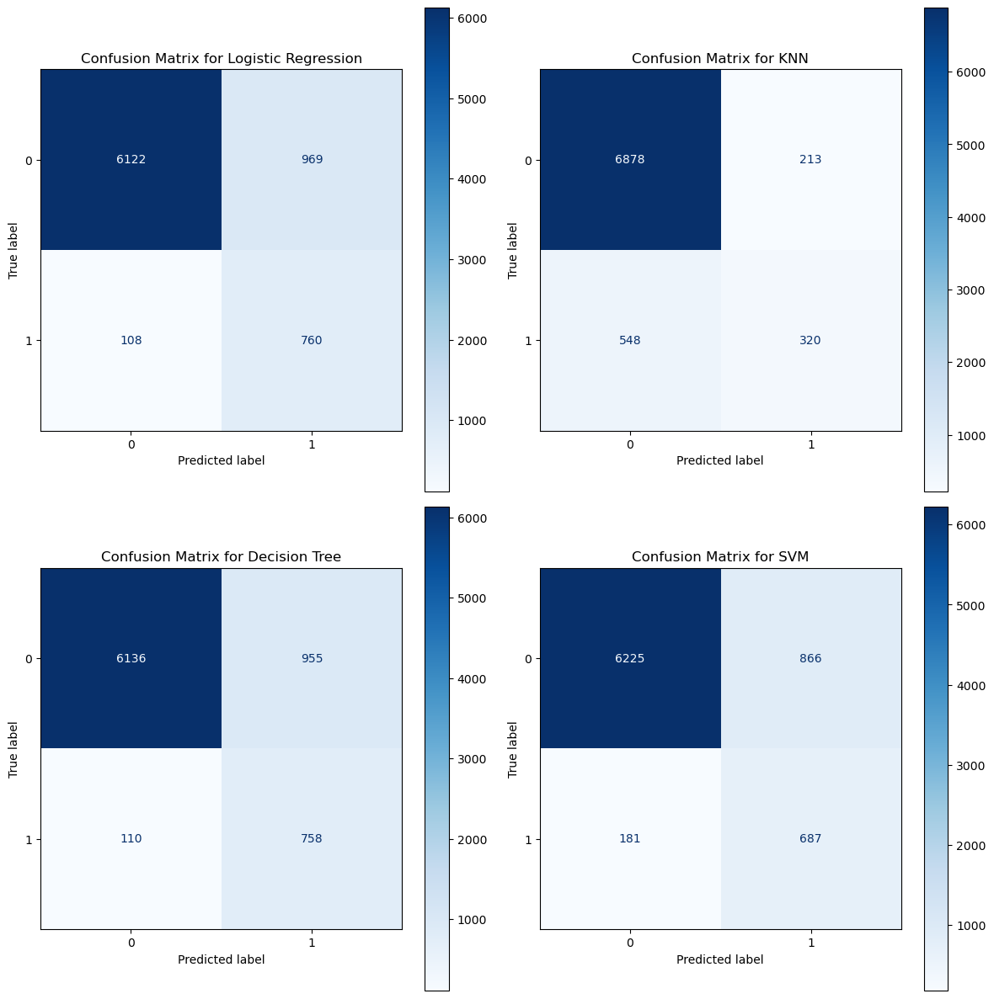

In [69]:
# Display the confusion matrix for all models and show as subplot
models = {
    'Logistic Regression': log_best_model,
    'KNN': knn_best_model,
    'Decision Tree': dt_best_model,
    'SVM': svm_best_model
}

fig, axes = plt.subplots(2, 2, figsize=(12, 12))
axes = axes.flatten()

for ax, (model_name, model) in zip(axes, models.items()):
    y_pred = model.predict(X_test)
    cm = confusion_matrix(y_test, y_pred)
    disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=model.classes_)
    disp.plot(cmap='Blues', ax=ax)
    ax.set_title(f'Confusion Matrix for {model_name}')

plt.tight_layout()
plt.show()

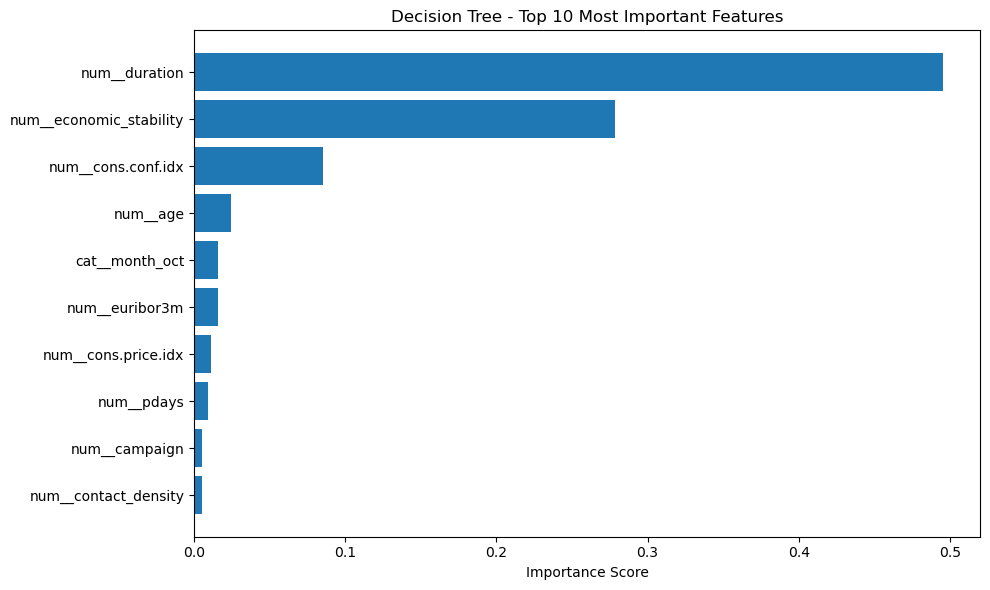

Top 10 Most Important Features for Decision Tree:
 2. num__duration: 0.4951
13. num__economic_stability: 0.2785
 8. num__cons.conf.idx: 0.0851
 1. num__age: 0.0243
47. cat__month_oct: 0.0158
 9. num__euribor3m: 0.0158
 7. num__cons.price.idx: 0.0109
 4. num__pdays: 0.0091
 3. num__campaign: 0.0055
12. num__contact_density: 0.0052


In [70]:
# Get the Decision Tree model from the pipeline
dt_model = dt_best_model.named_steps['classifier']

# Get feature importances
importances = dt_model.feature_importances_

# Get feature names after preprocessing
# The preprocessor might have created new features (like one-hot encoded columns)
feature_names = dt_best_model.named_steps['preprocessor'].get_feature_names_out()

# Create DataFrame
feature_importance_df = pd.DataFrame({
    'Feature': feature_names,
    'Importance': importances
}).sort_values('Importance', ascending=False)

# Plot top 10 features
plt.figure(figsize=(10, 6))
plt.barh(feature_importance_df['Feature'].head(10), 
         feature_importance_df['Importance'].head(10))
plt.xlabel('Importance Score')
plt.title('Decision Tree - Top 10 Most Important Features')
plt.gca().invert_yaxis()
plt.tight_layout()
plt.show()

# Print top features
print("Top 10 Most Important Features for Decision Tree:")
print("=" * 50)
for i, row in feature_importance_df.head(10).iterrows():
    print(f"{i+1:2d}. {row['Feature']}: {row['Importance']:.4f}")

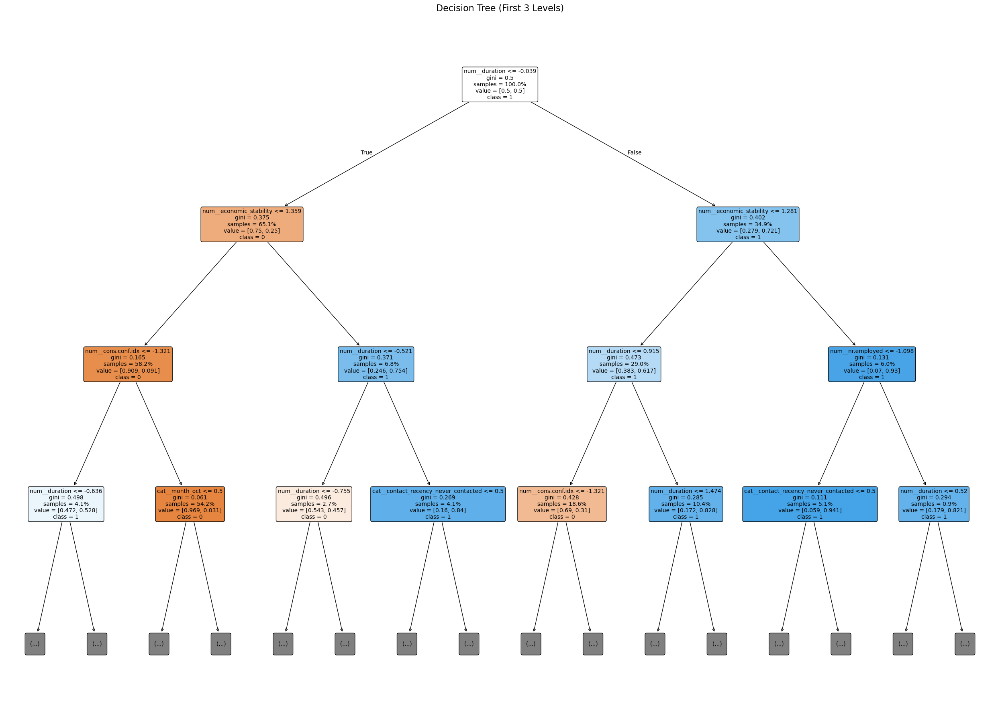

In [71]:
# Get the Decision Tree model from the pipeline
dt_model = dt_best_model.named_steps['classifier']

# Get feature names after preprocessing
feature_names = dt_best_model.named_steps['preprocessor'].get_feature_names_out()

# Get class names
class_names = [str(x) for x in dt_model.classes_]

# Plot the decision tree
plt.figure(figsize=(25, 18))
plot_tree(dt_model,
          feature_names=feature_names,
          class_names=class_names,
          filled=True,
          rounded=True,
          proportion=True,
          max_depth=3,
          fontsize=10)
plt.title("Decision Tree (First 3 Levels)", fontsize=16)
plt.tight_layout()
plt.show()

In [72]:
# FINAL LOGISTIC REGRESSION MODEL WITH OPTIMAL HYPERPARAMETERS

final_logreg_pipeline = Pipeline(steps=[
    ('preprocessor', preprocessor),
    ('classifier', LogisticRegression(
        C=10,
        class_weight='balanced',
        max_iter=500,
        random_state=42
    ))
])

    
# Train the final model
final_logreg_pipeline.fit(X_train, y_train)

# Make predictions
y_pred_train = final_logreg_pipeline.predict(X_train)
y_pred_test = final_logreg_pipeline.predict(X_test)
y_pred_proba = final_logreg_pipeline.predict_proba(X_test)[:, 1]  # Probability scores

# Calculate metrics
train_accuracy = accuracy_score(y_train, y_pred_train)
test_accuracy = accuracy_score(y_test, y_pred_test)
test_recall = recall_score(y_test, y_pred_test)
test_precision = precision_score(y_test, y_pred_test)

# Display results
print("FINAL LOGISTIC REGRESSION MODEL - PERFORMANCE SUMMARY")
print(f"Training Accuracy:   {train_accuracy:.4f}")
print(f"Testing Accuracy:    {test_accuracy:.4f}")
print(f"Testing Recall:      {test_recall:.4f} HIGHEST (Primary Objective)")
print(f"Testing Precision:   {test_precision:.4f}")


# Classification report
print("\nCLASSIFICATION REPORT:")
print(classification_report(y_test, y_pred_test))

# Confusion matrix
print("\nCONFUSION MATRIX:")
cm = confusion_matrix(y_test, y_pred_test)
print(cm)
print(f"True Negatives:  {cm[0,0]}")
print(f"False Positives: {cm[0,1]}")
print(f"False Negatives: {cm[1,0]} Minimized (Our Goal)")
print(f"True Positives:  {cm[1,1]}")

FINAL LOGISTIC REGRESSION MODEL - PERFORMANCE SUMMARY
Training Accuracy:   0.8605
Testing Accuracy:    0.8652
Testing Recall:      0.8767 HIGHEST (Primary Objective)
Testing Precision:   0.4406

CLASSIFICATION REPORT:
              precision    recall  f1-score   support

           0       0.98      0.86      0.92      7091
           1       0.44      0.88      0.59       868

    accuracy                           0.87      7959
   macro avg       0.71      0.87      0.75      7959
weighted avg       0.92      0.87      0.88      7959


CONFUSION MATRIX:
[[6125  966]
 [ 107  761]]
True Negatives:  6125
False Positives: 966
False Negatives: 107 Minimized (Our Goal)
True Positives:  761


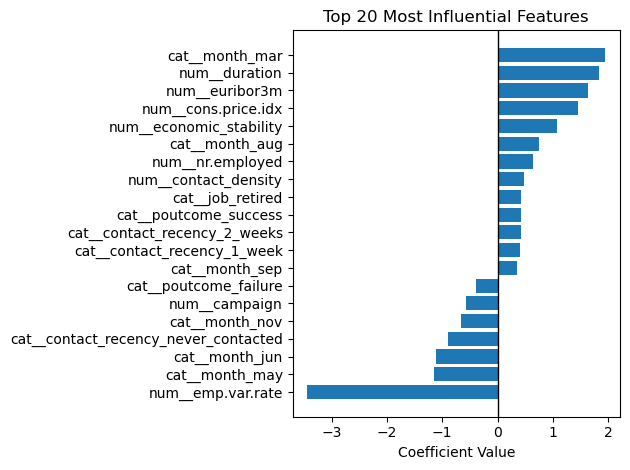

In [73]:
# Feature coefficients (for interpretation)

feature_names = final_logreg_pipeline.named_steps['preprocessor'].get_feature_names_out()
coefficients = final_logreg_pipeline.named_steps['classifier'].coef_[0]

# Create coefficient DataFrame
coef_df = pd.DataFrame({
    'Feature': feature_names,
    'Coefficient': coefficients,
    'Abs_Coefficient': np.abs(coefficients)
}).sort_values('Abs_Coefficient', ascending=False)

# Display top 20 most important features
top_features = coef_df.head(20).sort_values("Coefficient", ascending=True)

plt.barh(top_features["Feature"], top_features["Coefficient"])
plt.axvline(0, color="black", linewidth=1)
plt.xlabel("Coefficient Value")
plt.title("Top 20 Most Influential Features")
plt.tight_layout()
plt.show()

In [74]:
print('''
CONCLUSIONS:
    - High employment variance is the biggest negative indicator for conversion
    - May & June are the next biggest negative indicator for conversion. Portugal tax season is from April to June.
    - The month March which is the month before the tax season is the biggest indicator for conversion.
    - Consumer price Index is positively linked to conversion as people try to fight inflation with term deposit on savings.
    - The retiree group also stood out for more coversion.
''')


CONCLUSIONS:
    - High employment variance is the biggest negative indicator for conversion
    - May & June are the next biggest negative indicator for conversion. Portugal tax season is from April to June.
    - The month March which is the month before the tax season is the biggest indicator for conversion.
    - Consumer price Index is positively linked to conversion as people try to fight inflation with term deposit on savings.
    - The retiree group also stood out for more coversion.

